# Dependencies

## Import the YOLO implementation of Ultralytics

In [1]:
import ultralytics
from ultralytics import YOLO

## Import Image-processing/visualisation libraries

In [44]:
import cv2 
import numpy as np 
import matplotlib.pyplot as plt 
from PIL import Image 
from IPython.display import display

import warnings 
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')  # Suppress Matplotlib warnings
plt.rcParams["figure.figsize"] = [3.0, 3.0]

## Import the EigenCam class and the visualisation function

In [3]:
from yolo_cam.eigen_cam import EigenCAM
from yolo_cam.utils.image import show_cam_on_image

# EigenCAM on the classification model

## Image-preprocessing

In [4]:
img = cv2.imread('images/puppies.jpg')
img = cv2.resize(img, (640, 640))
rgb_img = img.copy()
img = np.float32(img) / 255

## Loading the classification model on CPU

In [5]:
model = YOLO('models/yolo11n-cls.pt') 
model = model.cpu()

In [6]:
target_layers =[model.model.model[-1].conv]

In [7]:
#print(model)
#print(model.model)
print(model.model.model[-1].conv)

Conv(
  (conv): Conv2d(256, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn): BatchNorm2d(1280, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act): SiLU(inplace=True)
)



0: 224x224 Labrador_retriever 0.73, golden_retriever 0.18, Maltese_dog 0.02, West_Highland_white_terrier 0.01, Great_Pyrenees 0.01, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)
Object classification


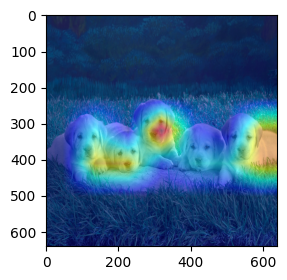

In [8]:
with EigenCAM(model, target_layers,task='classification') as cam:
    grayscale_cam = cam(rgb_img)[0, :, :]
    cam_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)
    plt.imshow(cam_image)
    plt.show()

## You can also add multiple layers as your target layers 
#### *This may not work as you expect. It could be because of the model's architecture

In [9]:
target_layers =[model.model.model[-2], model.model.model[-3], model.model.model[-4]]


0: 224x224 Labrador_retriever 0.73, golden_retriever 0.18, Maltese_dog 0.02, West_Highland_white_terrier 0.01, Great_Pyrenees 0.01, 6.2ms
Speed: 2.9ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)
Object classification


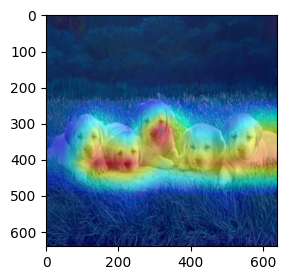

In [10]:
with EigenCAM(model, target_layers,task='classification') as cam:
    grayscale_cam = cam(rgb_img)[0, :, :]
    cam_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)
    plt.imshow(cam_image)
    plt.show()

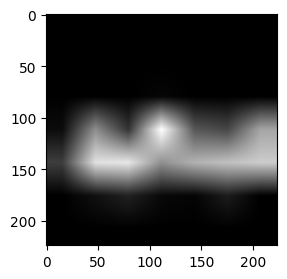

In [11]:
g_scale = cv2.resize(np.stack([grayscale_cam] * 3, axis=2), (224,224))

plt.imshow(g_scale, cmap='gray')
plt.show()

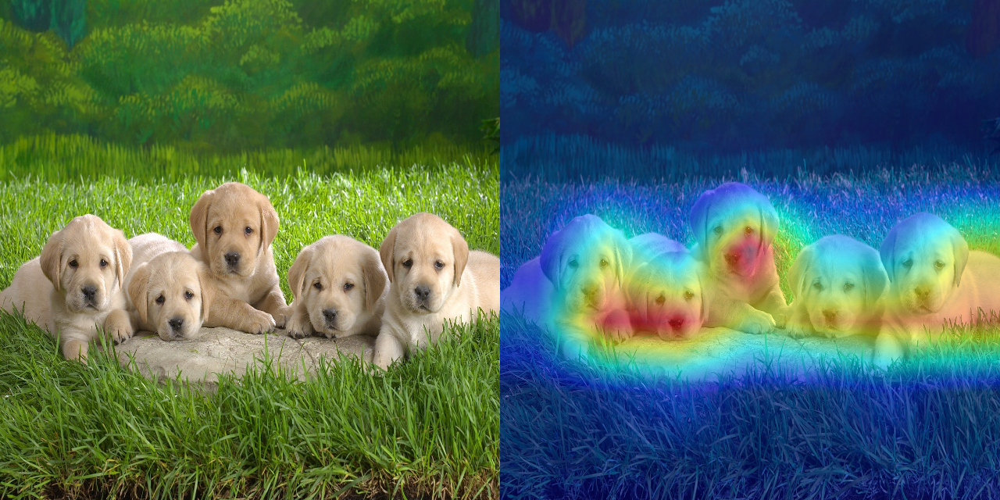

In [12]:
im = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2BGR)
Image.fromarray(np.hstack((im, cam_image)))

# EigenCAM on the detection model

In [13]:
model = YOLO('models/yolo11n.pt')
model = model.cpu()

In [14]:
target_layers =[model.model.model[-2]]

In [15]:
img = cv2.imread('images/puppies.jpg')
img = cv2.resize(img, (640, 640))
rgb_img = img.copy()
img = np.float32(img) / 255


0: 640x640 3 dogs, 3 bears, 62.3ms
Speed: 1.1ms preprocess, 62.3ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Object detection


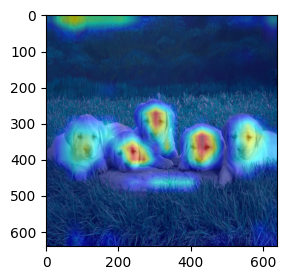

In [16]:
with EigenCAM(model, target_layers,task='detection') as cam:
    grayscale_cam = cam(rgb_img)[0, :, :]
    cam_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)
    plt.imshow(cam_image)
    plt.show()

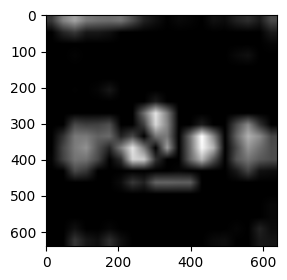

In [17]:
g_scale = np.stack([grayscale_cam] * 3, axis=2)
plt.imshow(g_scale)

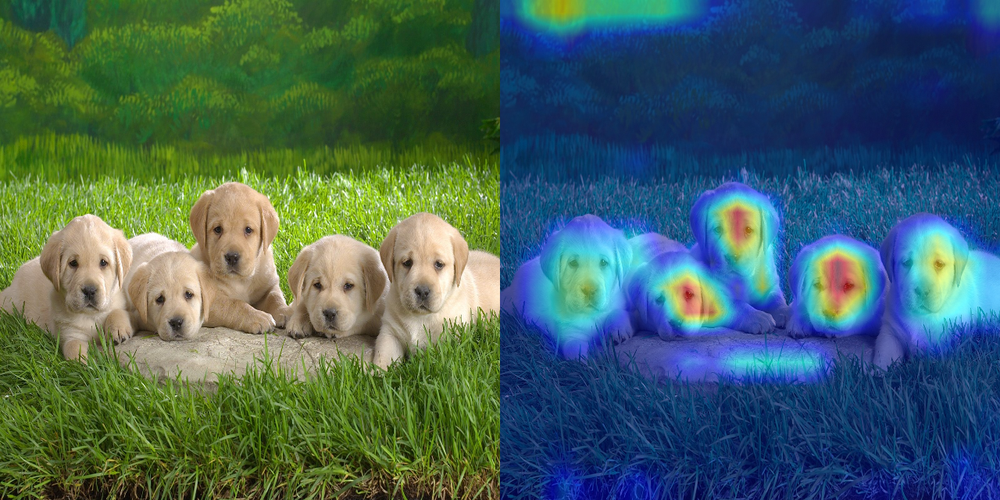

In [18]:
im = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2BGR)
Image.fromarray(np.hstack((im, cam_image)))

In [19]:
# multi scale CAM for yolov11 detection model, 16,19,22 represent small, medium, large object detect head of yolov11.
def doMultiScaleCAM(modelPath, imagePath, modelIndexes=[16,19,22]):
    model = YOLO(modelPath)
    model = model.cpu()
    img = cv2.imread(imagePath)
    img = cv2.resize(img, (640, 640))
    rgb_img = img.copy()
    img = np.float32(img) / 255
    for i in modelIndexes:
        target_layers =[model.model.model[i]]
        cam = EigenCAM(model, target_layers,task='detection')
        grayscale_cam = cam(rgb_img)[0, :, :]
        cam_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)
        plt.imshow(cam_image)
        plt.show()
    im = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)
    res = model(rgb_img)[0]
    res = cv2.cvtColor(res.plot(), cv2.COLOR_BGR2RGB)
    return Image.fromarray(np.hstack((im,res)))


0: 640x640 3 dogs, 3 bears, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
Object detection


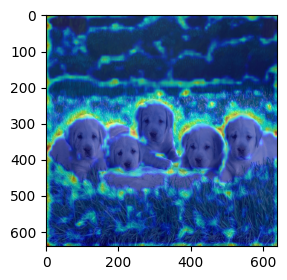


0: 640x640 3 dogs, 3 bears, 42.5ms
Speed: 1.2ms preprocess, 42.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)
Object detection


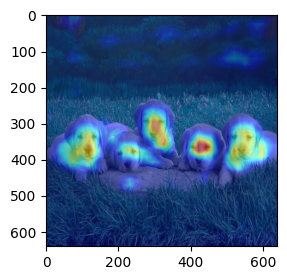


0: 640x640 3 dogs, 3 bears, 35.2ms
Speed: 1.2ms preprocess, 35.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)
Object detection


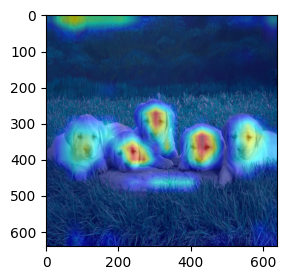


0: 640x640 3 dogs, 3 bears, 35.6ms
Speed: 1.1ms preprocess, 35.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


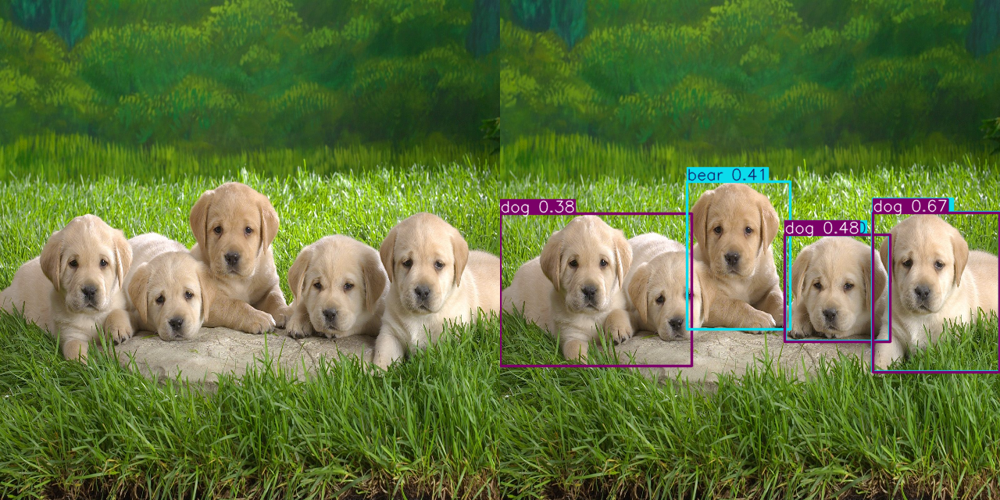

In [20]:
doMultiScaleCAM('models/yolo11n.pt', 'images/puppies.jpg')

# EigenCAM on the segmentation model


In [21]:
model = YOLO('models/yolo11n-seg.pt')
model = model.cpu()

In [22]:
img = cv2.imread('images/puppies.jpg')
img = cv2.resize(img, (640, 640))
rgb_img = img.copy()
img = np.float32(img) / 255

In [23]:
target_layers =[model.model.model[-4]]

In [24]:
results = model(rgb_img)


0: 640x640 5 dogs, 59.0ms
Speed: 1.1ms preprocess, 59.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)



0: 640x640 5 dogs, 50.4ms
Speed: 1.2ms preprocess, 50.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


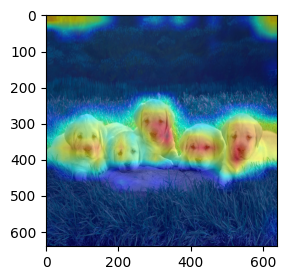

In [25]:
cam = EigenCAM(model, target_layers,task='segmentation')
grayscale_cam = cam(rgb_img)[0, :, :]
cam_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)
plt.imshow(cam_image)
plt.show()

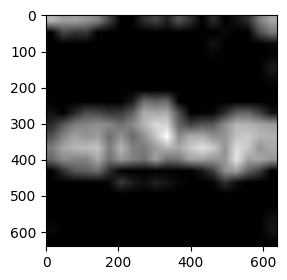

In [26]:
g_scale = np.stack([grayscale_cam] * 3, axis=2)
plt.imshow(g_scale)
plt.show()

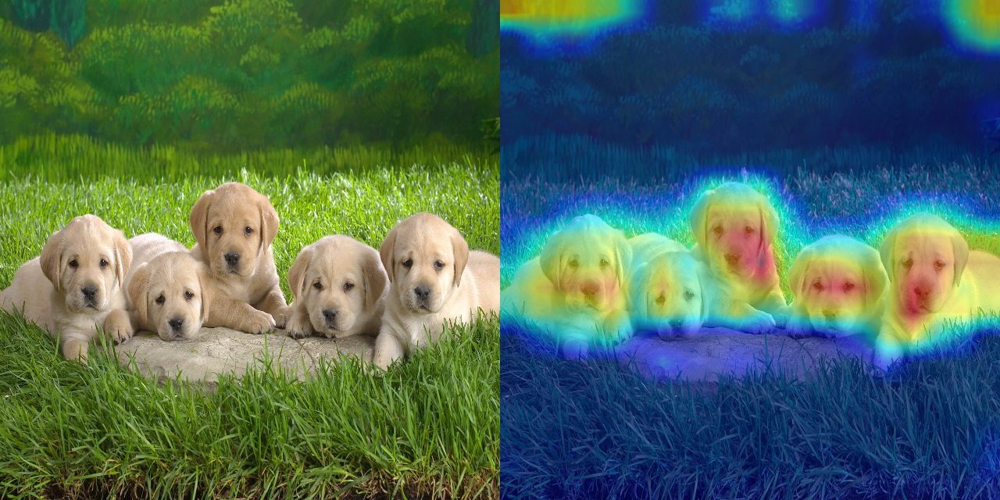

In [27]:
im = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2BGR)
Image.fromarray(np.hstack((im, cam_image)))

# EigenCAM on the obb model

In [28]:
model = YOLO('models/yolo11n-obb.pt')
model = model.cpu()

In [29]:
img = cv2.imread('images/puppies.jpg')
img = cv2.resize(img, (640, 640))
rgb_img = img.copy()
img = np.float32(img) / 255

In [37]:
target_layers =[model.model.model[-2]]


0: 1024x1024 1 roundabout, 121.3ms
Speed: 4.4ms preprocess, 121.3ms inference, 0.9ms postprocess per image at shape (1, 3, 1024, 1024)


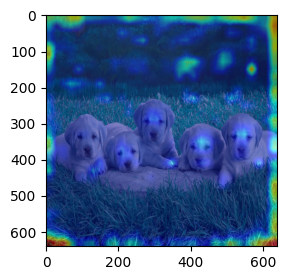

In [38]:
with EigenCAM(model, target_layers,task='obb') as cam:
    grayscale_cam = cam(rgb_img)[0, :, :]
    cam_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)
    plt.imshow(cam_image)
    plt.show()


0: 1024x1024 1 roundabout, 118.7ms
Speed: 4.0ms preprocess, 118.7ms inference, 0.9ms postprocess per image at shape (1, 3, 1024, 1024)


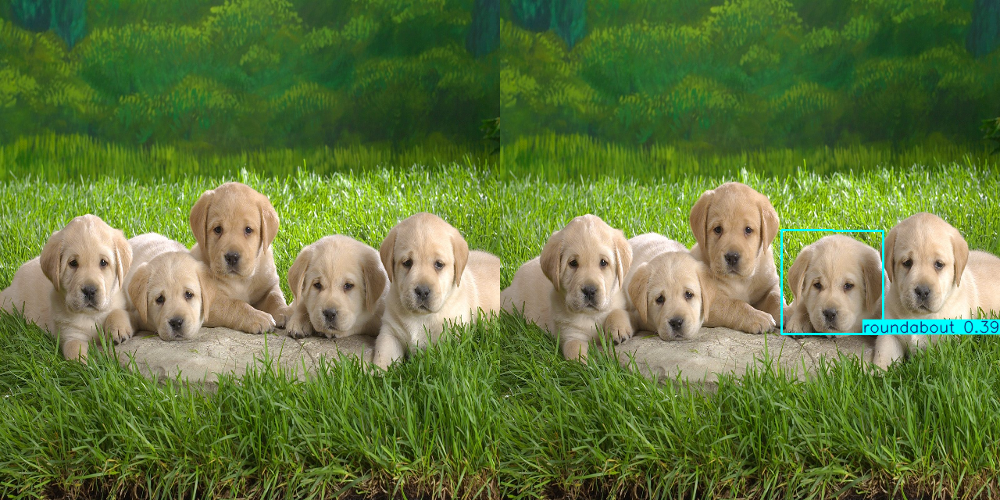

In [45]:
im = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)
res = model(rgb_img)[0]
res = cv2.cvtColor(res.plot(), cv2.COLOR_BGR2RGB)

display(Image.fromarray(np.hstack((im,res))))


Yes, the yolo obb is terrible at spotting dogs and the EigenMap hinted it.

# Notes on the target layers

Currently, picking the right layer for visualisation is a science of its own. You can use the suggested values above or explore the layers yourself. We will try to add more information and guidelines in due time.Feel free to contribute your own observations. 